In [3]:
#!pip install ISR


In [30]:
import numpy as np
from PIL import Image, ImageOps
from ISR.models import RDN, RRDN
import requests



In [17]:
def download_image(url):
    return Image.open(requests.get(url, stream=True).raw)

dog_url = "https://mbtimetraveler.files.wordpress.com/2016/01/sad-cute-dog-high-resolution-wallpaper-for-desktop-background-download-dog-photos-free.jpg?w=1800"
im = download_image(dog_url)

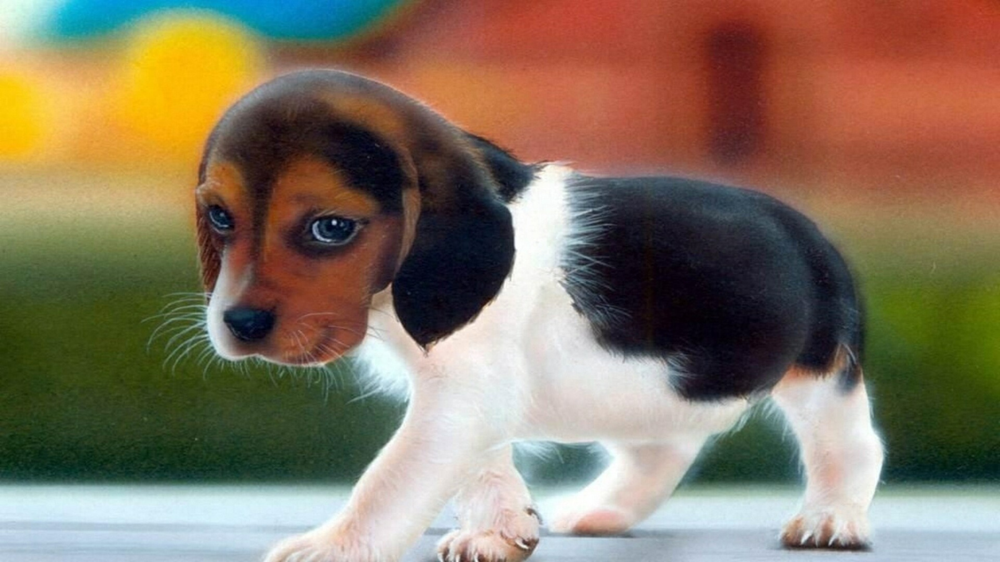

In [18]:
im

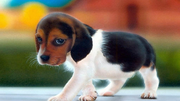

In [14]:
def downsample(img, r=0.1):
    """ downsample an image by a percentage
        :param img, a PIL Image format
        :r ratio, the percentage new image size
    """
    width, height = img.size
    w = int(width*r)
    h = int(height*r)
    if 'P' in img.mode: # check if image is a palette type
        img = img.convert("RGB") # convert it to RGB
        img = img.resize((w,h),Image.ANTIALIAS) # resize it
        img = img.convert("P",dither=Image.NONE, palette=Image.ADAPTIVE) 
           #convert back to palette
    else:
        img = img.resize((w,h),Image.ANTIALIAS) # regular resize
    return img

im_lr = downsample(im)
im_lr

In [16]:
#load super resolution models
model_lg = RDN(weights="psnr-large")
model_sm = RDN(weights="psnr-small") 
model_nc = RDN(weights="noise-cancel")
gan_model = RRDN(weights='gans')


17465344/17462488 [==============================] - 2s 0us/step


In [19]:
lr_img = np.array(im_lr)

sr1 = model_sm.predict(lr_img)
sr2 = model_lg.predict(lr_img)
sr3 = model_nc.predict(lr_img)
sr4 = gan_model.predict(lr_img)

In [48]:
def super_res(img):
    """ helper function, will take a PIL image and use 
        the GAN model to increase to super resolution
    """
    arr = np.array(img)
    pred = gan_model.predict(arr)
    return Image.fromarray(pred)


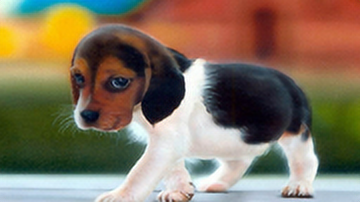

In [24]:
Image.fromarray(sr1)

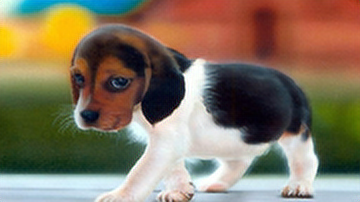

In [25]:
Image.fromarray(sr2)

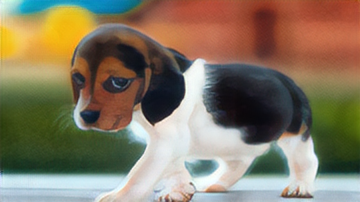

In [26]:
Image.fromarray(sr3)

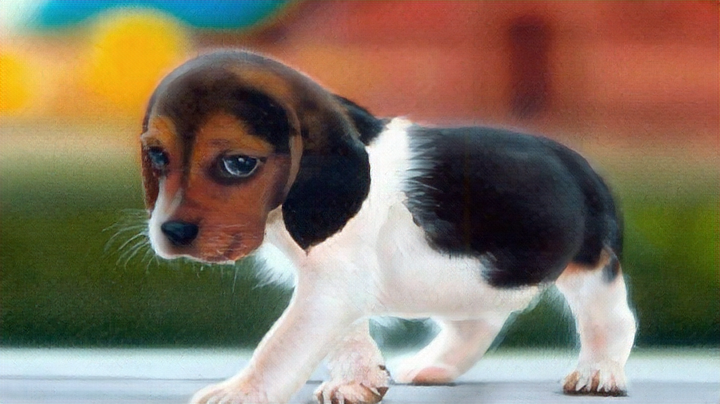

In [27]:
Image.fromarray(sr4)

## Other tests
Get a small subsample of an image, increase resolution on that

In [28]:
city_url = "https://images.unsplash.com/photo-1449824913935-59a10b8d2000?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=1650&q=80"
city_im = download_image(city_url)

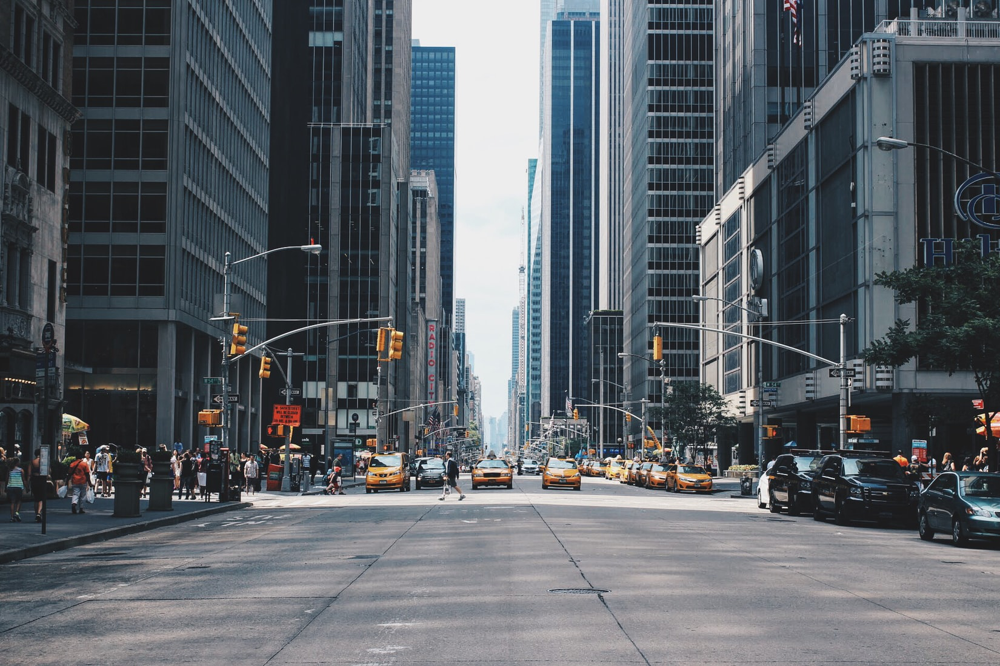

In [29]:
city_im

0


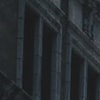

1


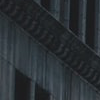

2


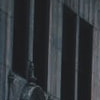

3


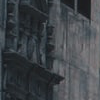

4


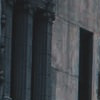

5


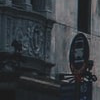

6


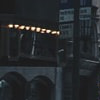

7


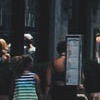

8


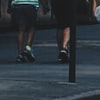

9


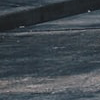

10


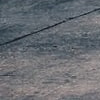

11


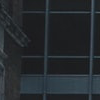

12


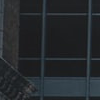

13


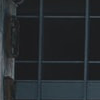

14


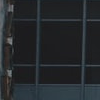

15


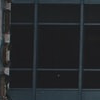

16


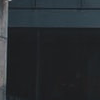

17


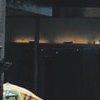

18


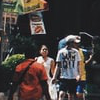

19


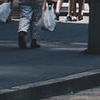

20


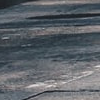

21


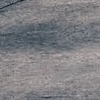

22


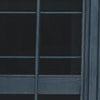

23


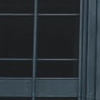

24


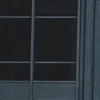

25


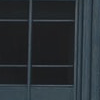

26


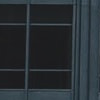

27


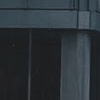

28


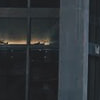

29


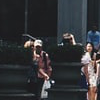

30


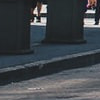

31


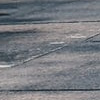

32


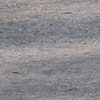

33


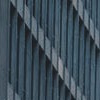

34


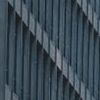

35


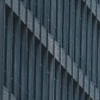

36


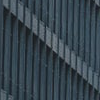

37


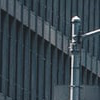

38


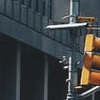

39


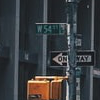

40


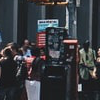

41


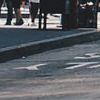

42


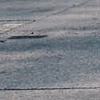

43


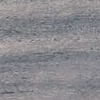

44


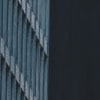

45


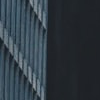

46


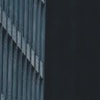

47


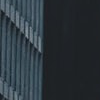

48


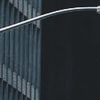

49


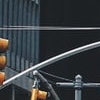

50


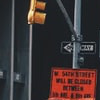

51


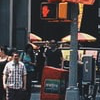

52


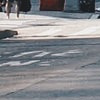

53


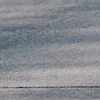

54


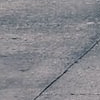

55


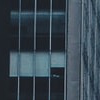

56


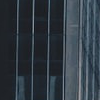

57


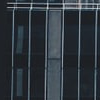

58


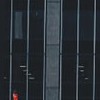

59


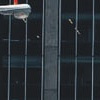

60


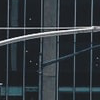

61


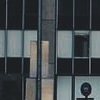

62


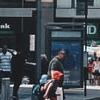

63


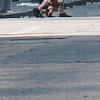

64


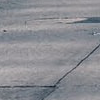

65


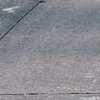

66


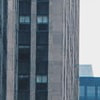

67


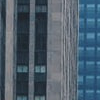

68


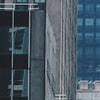

69


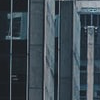

70


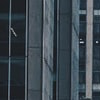

71


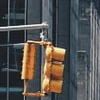

72


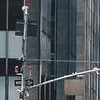

73


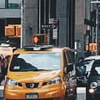

74


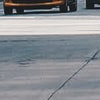

75


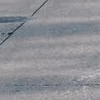

76


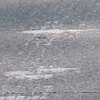

77


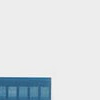

78


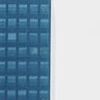

79


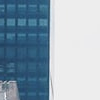

80


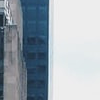

81


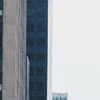

82


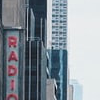

83


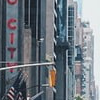

84


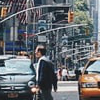

85


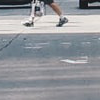

86


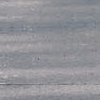

87


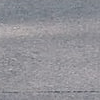

88


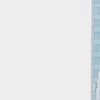

89


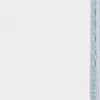

90


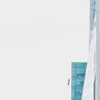

91


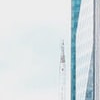

92


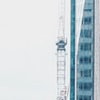

93


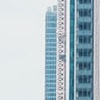

94


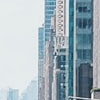

95


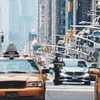

96


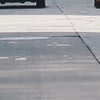

97


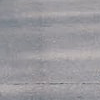

98


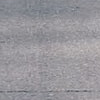

99


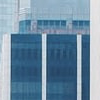

100


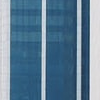

101


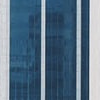

102


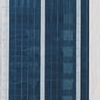

103


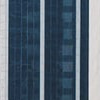

104


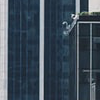

105


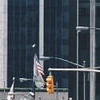

106


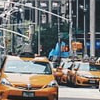

107


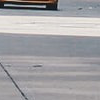

108


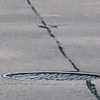

109


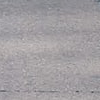

110


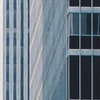

111


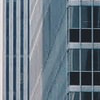

112


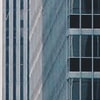

113


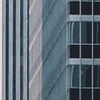

114


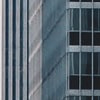

115


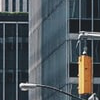

116


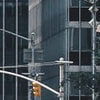

117


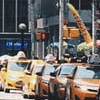

118


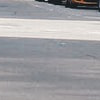

119


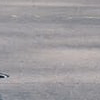

120


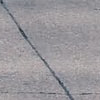

121


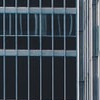

122


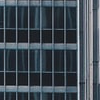

123


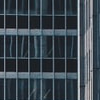

124


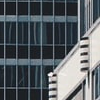

125


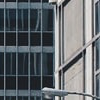

126


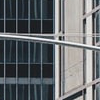

127


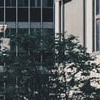

128


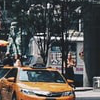

129


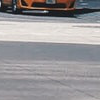

130


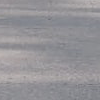

131


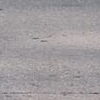

132


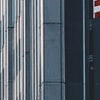

133


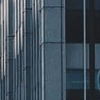

134


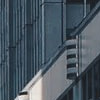

135


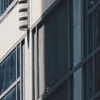

136


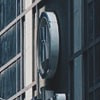

137


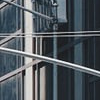

138


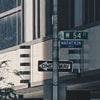

139


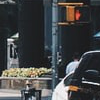

140


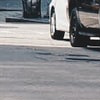

141


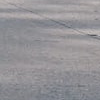

142


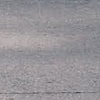

143


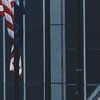

144


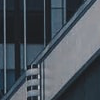

145


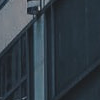

146


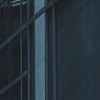

147


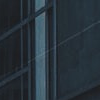

148


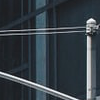

149


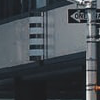

150


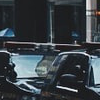

151


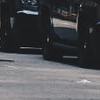

152


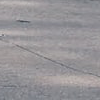

153


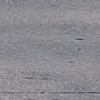

154


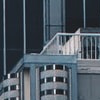

155


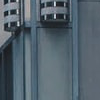

156


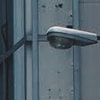

157


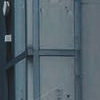

158


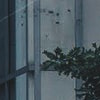

159


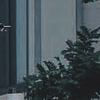

160


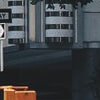

161


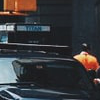

162


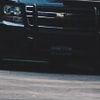

163


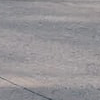

164


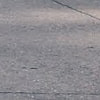

165


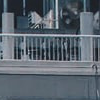

166


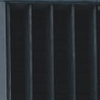

167


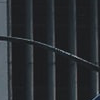

168


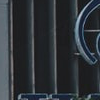

169


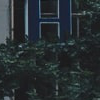

170


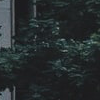

171


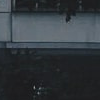

172


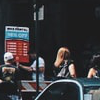

173


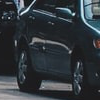

174


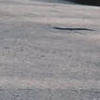

175


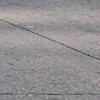

176


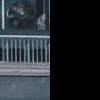

177


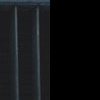

178


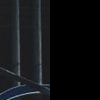

179


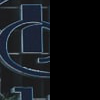

180


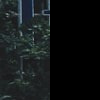

181


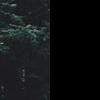

182


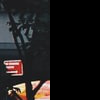

183


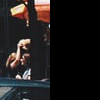

184


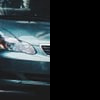

185


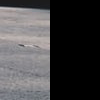

186


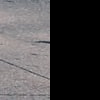

In [43]:
#get a crop of a single point of interest
w,h = city_im.size
crops = []
for i in range(0, w, 100):
    for j in range(0, h, 100):
        area = (i,j,i+100,j+100)
        crops.append(city_im.crop(area))
        
for i,crop in enumerate(crops):
    print(i)
    display(crop)

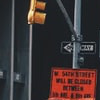

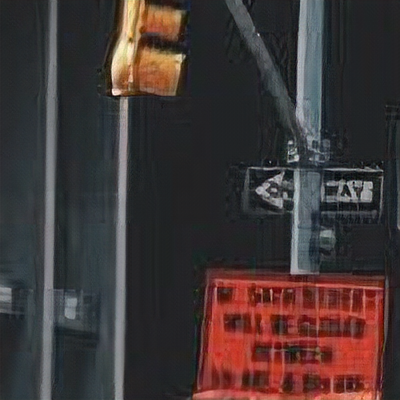

In [49]:
city_slice = crops[50]
display(city_slice)
display(super_res(city_slice))

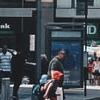

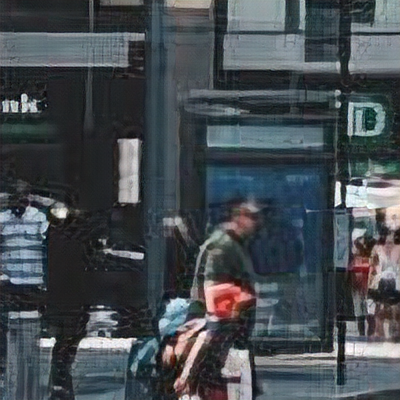

In [50]:
city_slice = crops[62]
display(city_slice)
display(super_res(city_slice))

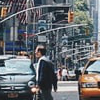

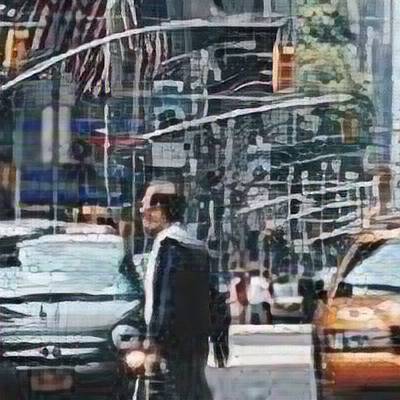

In [51]:
city_slice = crops[84]
display(city_slice)
display(super_res(city_slice))

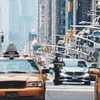

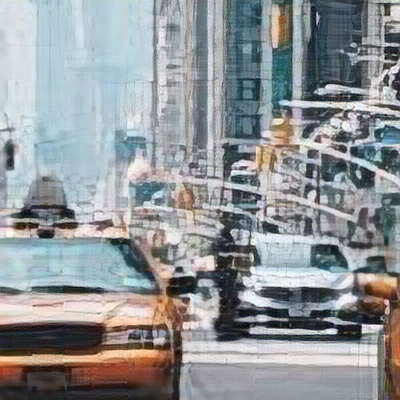

In [52]:
city_slice = crops[95]
display(city_slice)
display(super_res(city_slice))